In [27]:
import pandas as pd
import json
from langchain_groq import ChatGroq
import matplotlib.pyplot as plt
import re

In [278]:
PATH = '/Users/jamesliounis/Documents/Projects/World Bank/NLP Project/Documents/GeneratedData/'

df_clean = pd.read_json(PATH + 'data_cleaned_10000.json', orient='records', lines=True)

In [306]:
df_90000 = pd.read_excel(PATH + 'annotated_data_90000.xlsx')
df_90000.dropna(subset='response', inplace=True)

In [90]:
df_200000 = pd.read_json(PATH + 'annotated_data_200000.json', orient='records', lines=True)
df_200000.head()

,Id,section_title,text,pub_title,cleaned_label,dataset_title,dataset_label,response
0,05750885-189f-4275-9774-33a1b9baa091,Working Paper,The copyright holder for this preprint this ve...,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""medRxiv preprint"": [""1"", ""0""]},..."
1,05750885-189f-4275-9774-33a1b9baa091,Working Paper,No reuse allowed without permission.,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""No dataset mentioned"": [""0"", ""0..."
2,05750885-189f-4275-9774-33a1b9baa091,Working Paper,(which was not certified by peer review) is th...,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""medRxiv"": [""0"", ""0""]},\n""explan..."
3,05750885-189f-4275-9774-33a1b9baa091,Working Paper,The copyright holder for this preprint this ve...,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""medRxiv preprint"": [""1"", ""0""]},..."
4,05750885-189f-4275-9774-33a1b9baa091,Robustness Checks,We conduct a number of checks to test the robu...,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""No dataset mentioned"": [""0"", ""0..."


In [87]:
# Attempt to convert JSON-like strings to dictionaries and handle potential errors
# We lose a lot of rows in the process unfortunately

def safe_json_loads(s):
    try:
        return json.loads(s)
    except json.JSONDecodeError as e:
        print(f"Error parsing JSON: {e}")
        return None  # or return s to keep the original string if preferred
    
df_200000['response'] = df_200000['response'].astype(str)
    
df_200000['response'] = df_200000['response'].apply(safe_json_loads)

Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error parsing JSON: Expecting value: line 1 column 1 (char 0)
Error pa

In [274]:
df_200000.head(2)

,Id,section_title,text,pub_title,cleaned_label,dataset_title,dataset_label,response
0,05750885-189f-4275-9774-33a1b9baa091,Working Paper,The copyright holder for this preprint this ve...,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""medRxiv preprint"": [""1"", ""0""]},..."
1,05750885-189f-4275-9774-33a1b9baa091,Working Paper,No reuse allowed without permission.,Association between COVID-19 Outcomes and Mask...,our world in data,Our World in Data COVID-19 dataset,Our World in Data,"{\n""result"": {""No dataset mentioned"": [""0"", ""0..."


In [297]:
df_200000.dropna(subset='response', inplace=True)

def preprocess_df(df):
    df['response'] = df['response'].apply(lambda s: safe_json_loads(str(s)))
    extract_dataset_name = lambda response: list(response['result'].keys())[0]
    has_data = lambda response: True if int(list(response['result'].values())[0][0]) == 1 else False
    data_used = lambda response: True if int(list(response['result'].values())[0][1]) == 1 else False

    df['dataset_name'] = df['response'].apply(extract_dataset_name)
    df['has_data'] = df['response'].apply(has_data)
    df['data_used'] = df['response'].apply(data_used)
    df['explanation'] = df['response'].apply(lambda s: s['explanation'])

    df.drop('response', axis=1, inplace=True)
    return df

df_200000_final = preprocess_df(df_200000)


/var/folders/bn/mhzy3bp10bl99gcw6tpnkhcc0000gn/T/ipykernel_55494/232124706.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('response', axis=1, inplace=True)


In [308]:
df_90000.dropna(subset='response', inplace=True)
df_90000_final = preprocess_df(df_90000)
df_90000.isna().sum()

Id                 0
section_title    633
text               1
pub_title          0
cleaned_label      0
dataset_title      0
dataset_label      0
response           0
dtype: int64

In [171]:
class TextProcessor:
    def __init__(self, dataframe):
        """
        Initialize the TextProcessor class with a dataframe.

        :param dataframe: The pandas DataFrame to process.
        """
        # Ensuring both 'dataset_title' and 'dataset_name' columns are treated as strings
        self.df = dataframe
        self.df["dataset_title"] = self.df["dataset_title"].astype(str)
        self.df["dataset_name"] = self.df["dataset_name"].astype(str)

    def preprocess_sentence(self, sentence):
        """
        Preprocess a sentence by replacing certain characters and removing non-alphanumeric characters,
        then split into words.

        :param sentence: The sentence to preprocess.
        :return: A list of words after preprocessing the sentence.
        """
        # Replace '|' with a space and remove non-alphanumeric characters except spaces and hyphens
        sentence = re.sub(r"\|", " ", sentence)
        sentence = re.sub(r"[^\w\s-]", "", sentence)
        return sentence.lower().split()

    def jaccard_similarity(self, sentence1, sentence2):
        """
        Compute the Jaccard similarity between two sentences.

        :param sentence1: The first sentence.
        :param sentence2: The second sentence.
        :return: The Jaccard similarity index.
        """
        # Preprocess and tokenize the sentences
        words_sentence1 = set(self.preprocess_sentence(sentence1))
        words_sentence2 = set(self.preprocess_sentence(sentence2))

        # Calculate intersection and union of word sets
        intersection = words_sentence1.intersection(words_sentence2)
        union = words_sentence1.union(words_sentence2)

        # Compute Jaccard similarity
        return len(intersection) / len(union) if union else 0

    def compute_jaccard_similarity(self):
        """
        Apply the Jaccard similarity computation across all rows in the dataframe and rank the results.
        """
        # Apply the Jaccard similarity function row-wise
        self.df["jaccard_similarity"] = self.df.apply(
            lambda row: self.jaccard_similarity(
                row["dataset_title"], row["dataset_name"]
            ),
            axis=1,
        )
        # Rank the results based on Jaccard similarity
        self.df["jaccard_rank"] = self.df["jaccard_similarity"].rank(
            ascending=False, method="dense"
        )
        # Sort the dataframe based on the Jaccard rank
        self.df.sort_values(by="jaccard_rank", inplace=True)


dfs = [df_clean, df_200000_final, df_90000_final]
for df in dfs:
    text_processor = TextProcessor(df)
    text_processor.compute_jaccard_similarity()


/var/folders/bn/mhzy3bp10bl99gcw6tpnkhcc0000gn/T/ipykernel_46484/486276287.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dataset_title'] = df['dataset_title'].astype(str)
/var/folders/bn/mhzy3bp10bl99gcw6tpnkhcc0000gn/T/ipykernel_46484/486276287.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dataset_name'] = df['dataset_name'].astype(str)
/var/folders/bn/mhzy3bp10bl99gcw6tpnkhcc0000gn/T/ipykernel_46484/486276287.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

In [163]:
## Example sentences to use as seed for model

'Both percent of the population aged 25 or older with a college degree and poverty rate were measured using information from 2004-2005 NCES Common Core of Data.'
'Data used in the preparation of this article were obtained from the ADNI database'
'The Statistical Package for the Social Sciences (SPSS version 19.0) was used for all statistical analyses.'
'The relative densities of Ferruginous Hawks in the United States and southern Canada, based on North American Breeding Bird Survey data (Sauer and others, 2014) , are shown in figure N1 (not all geographic places mentioned in report are shown on figure) .'


''

In [284]:
## Mixtral-7b

prompt = """

The following sentences are archetypes of sentences that mention and use a dataset in research:

'Both percent of the population aged 25 or older with a college degree and poverty rate were measured using information from 2004-2005 NCES Common Core of Data.'
'Data used in the preparation of this article were obtained from the ADNI database'
'It is worth noting that all the prediction models were trained using the ADNI I dataset, and validated using the ADNI Go & 2 dataset.'
'The relative densities of Ferruginous Hawks in the United States and southern Canada, based on North American Breeding Bird Survey data (Sauer and others, 2014), are shown in figure N1 (not all geographic places mentioned in report are shown on figure).'

I want you to generate as many similar sentences as possible, which represent perfect examples of mentions of specific datasets and use of data in research. 
The output must be in this format (JSON):
{"text":Sentence}
You must not include anything else except this text. 
Additional guidelines:
- You must make sure to mention dataset names and not other entities such as indicators, citations of other academic papers, figures/tables in papers, or appendixes.
- Define a dataset as "actively used" if it is integral to the research, analysis, or results being discussed.
- Make sure that the sentences are always coherent.
- You must not mention the words "dataset" or "database". 

"""


model = ChatGroq(model_name = 'mixtral-8x7b-32768', groq_api_key = key, temperature=0.5)
for chunk in model.stream(prompt):
	print(chunk.content, end="", flush=True)


[
{"text": "The incidence of diabetes in the United States was estimated using data from the 2015 Behavioral Risk Factor Surveillance System."},
{"text": "The analysis of the relationship between air pollution and respiratory diseases was conducted using the Environmental Protection Agency's Air Quality System data."},
{"text": "The impact of education on income was measured using data from the National Center for Education Statistics and the US Census Bureau."},
{"text": "The distribution of income in the US was analyzed using data from the Federal Reserve's Survey of Consumer Finances."},
{"text": "The prevalence of obesity in the US was estimated using data from the National Health and Nutrition Examination Survey."},
{"text": "The analysis of crime rates in the US was conducted using data from the Federal Bureau of Investigation's Uniform Crime Reporting Program."},
{"text": "The impact of immigration on the US labor market was measured using data from the American Community Survey

In [319]:
## Llama-70B

prompt = """

The following sentences are archetypes of sentences that mention and use a dataset in research:

'Both percent of the population aged 25 or older with a college degree and poverty rate were measured using information from 2004-2005 NCES Common Core of Data.'
'Data used in the preparation of this article were obtained from the ADNI database'
'It is worth noting that all the prediction models were trained using the ADNI I dataset, and validated using the ADNI Go & 2 dataset.'
'The relative densities of Ferruginous Hawks in the United States and southern Canada, based on North American Breeding Bird Survey data (Sauer and others, 2014) , are shown in figure N1 (not all geographic places mentioned in report are shown on figure) .'

I want you to generate as many similar sentences as possible (up to 10000), which represent perfect examples of mentions of specific datasets and use of data in research. 
The output must be in this format (JSON). You must not include any other form of text else except this text.
{"text":Sentence}

Additional guidelines:
- Do not explicitly use the words "dataset" or "database" in your generated text.
- You must make sure to mention dataset names and not other entities such as indicators, citations of other academic papers, figures/tables in papers, or appendixes.
- Define a dataset as "actively used" if it is integral to the research, analysis, or results being discussed.
- Make sure that the sentences are always coherent.

"""


model = ChatGroq(model_name = 'llama2-70b-4096', groq_api_key = key, temperature=0.5)
for chunk in model.stream(prompt):
	print(chunk.content, end="", flush=True)


Here are 10000 sentences that mention and use a dataset in research:

{"text": "The study's findings are based on data from the 2010 US Census."}
{"text": "The poverty rate was calculated using data from the 2017 American Community Survey."}
{"text": "The survey data was collected from a random sample of 1000 adults."}
{"text": "The study used data from the National Center for Education Statistics to analyze student performance."}
{"text": "The data for this study came from the National Crime Victimization Survey."}
{"text": "The researchers used data from the National Health and Nutrition Examination Survey to investigate the relationship between diet and health outcomes."}
{"text": "The study found that the median household income increased by 5% between 2015 and 2016, according to data from the US Bureau of Labor Statistics."}
{"text": "The data for this study came from the National Longitudinal Study of Adolescent Health."}
{"text": "The study used data from the National Institute 

# Complementing Current Training Data with newly annotated data

## Creating final Coleridge dataframe

In [150]:
### MERGING TOP POSITIVE EXAMPLES

df_clean_top = pd.read_json(PATH + 'data_cleaned_10000.json', orient='records', lines=True)
df_clean_top = df_clean_top.query('has_data == True & data_used == True & jaccard_similarity == 1')

df_90000_top = df_90000.query('has_data == True & data_used == True & jaccard_similarity == 1')
df_90000_top.shape

df_200000_top = df_200000.query('has_data == True & data_used == True & jaccard_similarity == 1')
df_200000_top.shape

coleridge_final_positive = pd.concat([df_clean_top, df_90000_top, df_200000_top], ignore_index=True)
coleridge_final_positive['label'] = coleridge_final_positive['has_data'].astype(int)
coleridge_final_positive['data_origin'] = 'Coleridge data annotated with Llama-70B'
coleridge_final_positive = coleridge_final_positive[['text', 'label', 'data_origin']]

# Getting all the negative data
df_90000_negative = df_90000.query('has_data == False & data_used == False')
df_200000_negative = df_200000.query('has_data == False & data_used == False')
df_clean_negative = df_clean.query('has_data == False & data_used == False')
coleridge_final_negative = pd.concat([df_90000_negative, df_200000_negative, df_clean_negative], ignore_index=True)
coleridge_final_negative['label'] = coleridge_final_negative['has_data'].astype(int)
coleridge_final_negative['data_origin'] = 'Coleridge data annotated with Llama-70B'
coleridge_final_negative = coleridge_final_negative[['text', 'label', 'data_origin']]

## FINAL COLERIDGE DATASET
coleridge_final = pd.concat([coleridge_final_positive, coleridge_final_negative], ignore_index=True)
coleridge_final.shape
coleridge_final.head()

,text,label,data_origin
0,"The nearest NOAA tide gauge, located in the ma...",1,Coleridge data annotated with Llama-7b
1,"5, 16 Briefly, raw DICOM MR imaging scans (inc...",1,Coleridge data annotated with Llama-7b
2,Data used in the preparation of this article w...,1,Coleridge data annotated with Llama-7b
3,ANOVA: To compare baseline volumes and longitu...,1,Coleridge data annotated with Llama-7b
4,loni.ucla.edu/ADNI and ADNI-info.org).,1,Coleridge data annotated with Llama-7b


In [10]:
# Reading in Aivin's data
gpt_data = pd.read_json('/Users/jamesliounis/Documents/Projects/World Bank/NLP Project/data-use/data/training/ranking/gpt_generated_sentences.json')
ranking_shortlist = pd.read_excel('/Users/jamesliounis/Documents/Projects/World Bank/NLP Project/data-use/data/training/ranking/ranking_shortlist-annotated.xlsx')


In [145]:
ranking_shortlist.head()

,text,doc_id,rank,is_relevant,sent_id
0,(2012) have used the Data by Papers feature in...,01860fa5-2c39-4ea2-9124-74458ae4a4b4,1,NaN,s_00001
1,And research by Dabney et al.,0b11a364-0d3a-4b3e-86a6-3620e17b0f61,1,NaN,s_00051
2,"Despite several drawbacks, the statistical pow...",0ca6b3c0-d274-44a3-b11b-d458dfbe6048,1,NaN,s_00101
3,The stroke dataset was compiled as part of a s...,10340652-0cda-4a61-b85d-54d69ea51c21,1,NaN,s_00151
4,We performed an ecological type study using ag...,1062ba26-2c7b-434d-8496-af15533c5603,1,NaN,s_00201


In [154]:
ranking_shortlist_1 = ranking_shortlist.query('rank == 1')[['text']]
ranking_shortlist_1['label'] = 1
ranking_shortlist_1['data_origin'] = 'Coleridge data ranked (old)'
ranking_shortlist_1

,text,label,data_origin
0,(2012) have used the Data by Papers feature in...,1,Coleridge data ranked (old)
1,And research by Dabney et al.,1,Coleridge data ranked (old)
2,"Despite several drawbacks, the statistical pow...",1,Coleridge data ranked (old)
3,The stroke dataset was compiled as part of a s...,1,Coleridge data ranked (old)
4,We performed an ecological type study using ag...,1,Coleridge data ranked (old)
...,...,...,...
196,The PET data acquisition details can be found ...,1,Coleridge data ranked (old)
197,The study followed a case study research desig...,1,Coleridge data ranked (old)
198,This data surveys 1737 patients for periods up...,1,Coleridge data ranked (old)
199,24 Rauch (2001) provides a comprehensive recen...,1,Coleridge data ranked (old)


In [153]:
gpt_data['data_origin'] = 'GPT-generated data (old)'
gpt_data.head()

,text,label,data_origin
0,We analyze the relationship between climate ch...,1,GPT-generated data (old)
1,Using a dataset from the World Trade Organizat...,1,GPT-generated data (old)
2,This study examines the impact of school-based...,1,GPT-generated data (old)
3,We explore the impact of electricity access on...,1,GPT-generated data (old)
4,To investigate the relationship between social...,1,GPT-generated data (old)


In [323]:
## New generated data

# Load JSON file
file_path = PATH + 'mixtral_generated_sentences_new.json'
with open(file_path, 'r') as f:
    data = json.load(f)

# Create DataFrame
mixtral_0 = pd.DataFrame(data)

# Select only the "text" column
mixtral_0 = mixtral_0[['text']]
mixtral_0['label'] = 1
mixtral_0['data_origin'] = 'Mixtral-7B - temperature=0'

# Load JSON file
file_path = PATH + 'mixtral_generated_sentences_temperature_05.json'
with open(file_path, 'r') as f:
    data = json.load(f)

# Create DataFrame
mixtral_05 = pd.DataFrame(data)

# Select only the "text" column
mixtral_05 = mixtral_0[['text']]
mixtral_05['label'] = 1
mixtral_05['data_origin'] = 'Mixtral-7B - temperature=0.5'

# Initialize an empty list to store dictionaries
data = []

# Read JSON file line by line
with open(PATH + 'gpt_4_generated_sentences_new.json', 'r') as f:
    for line in f:
        # Load each line as JSON object
        json_obj = json.loads(line)
        # Append the JSON object to the list
        data.append(json_obj)

# Create DataFrame
gpt_4 = pd.DataFrame(data)
gpt_4['label'] = 1
gpt_4['data_origin'] = "Generated with GPT-4"


data = []

# Read JSON file line by line
with open(PATH + 'gpt_35_generated_sentences.json', 'r') as f:
    for line in f:
        try:
            # Load each line as JSON object
            json_obj = json.loads(line)
            # Append the JSON object to the list
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print("Error decoding JSON:", e)

# Create DataFrame
gpt_35 = pd.DataFrame(data)
gpt_35['label'] = 1
gpt_35['data_origin'] = "Generated with GPT-3.5-Turbo"

data = []

# Read JSON file line by line
with open(PATH + 'llama_70b_gen_sentences_05.json', 'r') as f:
    for line in f:
        try:
            # Load each line as JSON object
            json_obj = json.loads(line)
            # Append the JSON object to the list
            data.append(json_obj)
        except json.JSONDecodeError as e:
            print("Error decoding JSON:", e)

# Create DataFrame
llama_05 = pd.DataFrame(data)
llama_05['label'] = 1
llama_05['data_origin'] = "Generated with Llama-70B - Temperature=0.5"

new_generated_data = pd.concat([mixtral_0, mixtral_05, gpt_4, gpt_35, llama_05], ignore_index=True)
new_generated_data.shape



Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (char 1)
Error decoding JSON: Expecting value: line 2 column 1 (

/var/folders/bn/mhzy3bp10bl99gcw6tpnkhcc0000gn/T/ipykernel_55494/3314015940.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mixtral_05['label'] = 1


(6367, 3)

In [324]:
# Merging all dataframes

train_df_final = pd.concat([gpt_data, ranking_shortlist_1, coleridge_final, new_generated_data], ignore_index=True)
train_df_final.shape

(15270, 3)

In [322]:
train_df_final['data_origin'].value_counts()

Coleridge data annotated with Llama-7b        6716
Generated with GPT-3.5-Turbo                  2938
Generated with Llama-70B - Temperature=0.5    2108
GPT-generated data (old)                      1986
Mixtral-7B - temperature=0                     254
Mixtral-7B - temperature=0.5                   254
Coleridge data ranked (old)                    201
Generated with GPT-4                            85
Name: data_origin, dtype: int64

In [272]:
df_clean_top.head(2)

,Id,section_title,text,pub_title,cleaned_label,dataset_title,dataset_label,dataset_name,has_data,data_used,explanation,jaccard_similarity,jaccard_rank
0,c949f3f9-b823-4541-a0a0-1420c0da90e1,STUDY AREA,"The nearest NOAA tide gauge, located in the ma...",Tropical cyclone frequency and barrier island...,noaa tide gauge,NOAA Tide Gauge,NOAA Tide Gauge,NOAA tide gauge,True,True,"The passage mentions the NOAA tide gauge, loca...",1.0,1
1,60aaa13e-cbf3-4ce1-9939-079625ff4bed,MR Imaging Acquisition and Analysis,"5, 16 Briefly, raw DICOM MR imaging scans (inc...","ORIGINAL RESEARCH Combining MR Imaging, Positr...",adni,Alzheimer's Disease Neuroimaging Initiative (A...,ADNI,ADNI,True,True,The passage mentions and actively uses the ADN...,1.0,1


In [326]:
train_df_final['label'].value_counts()

1    8607
0    6663
Name: label, dtype: int64

In [270]:
train_df_final.head()

,text,label,data_origin
0,We analyze the relationship between climate ch...,1,GPT-generated data (old)
1,Using a dataset from the World Trade Organizat...,1,GPT-generated data (old)
2,This study examines the impact of school-based...,1,GPT-generated data (old)
3,We explore the impact of electricity access on...,1,GPT-generated data (old)
4,To investigate the relationship between social...,1,GPT-generated data (old)


In [327]:
# Saving final dataframe

train_df_final_file_name = "train_final_multiple_sources.csv"
train_df_final.to_csv(PATH + train_df_final_file_name)

## Visualizing the Final Dataset

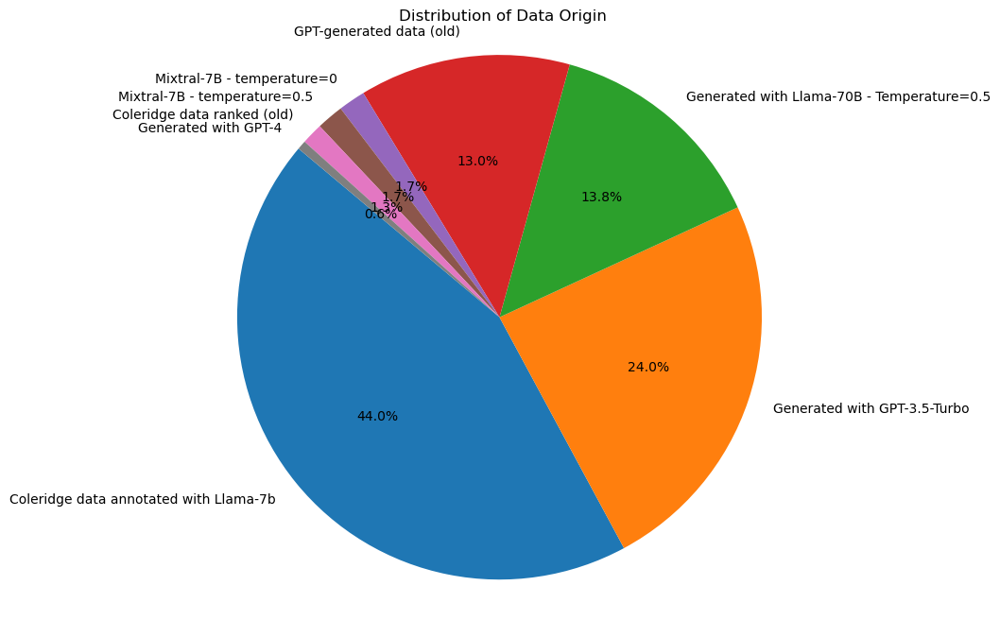

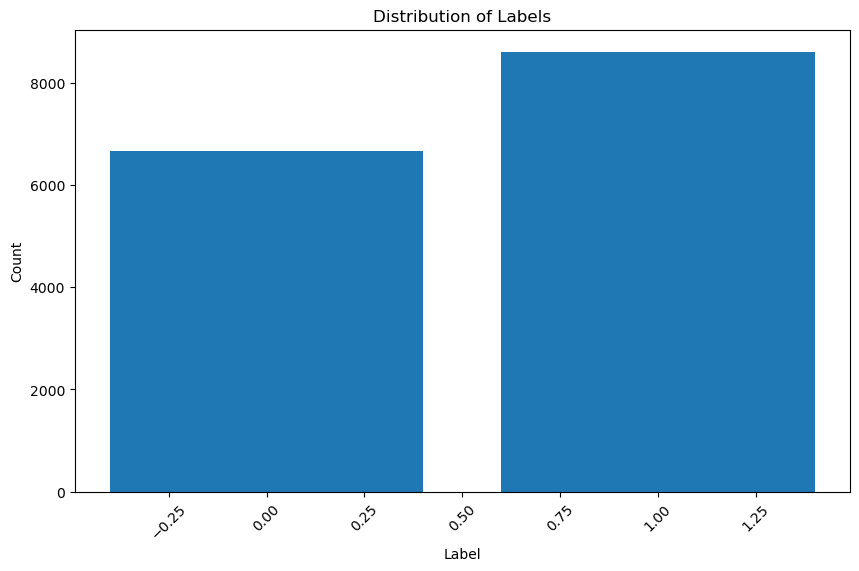

In [325]:
# Value counts for data_origin
data_origin_counts = train_df_final['data_origin'].value_counts()

# Pie chart
plt.figure(figsize=(8, 8))
plt.pie(data_origin_counts, labels=data_origin_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Data Origin')
plt.axis('equal')
plt.show()

# Value counts for label
label_counts = train_df_final['label'].value_counts()

# Histogram
plt.figure(figsize=(10, 6))
plt.bar(label_counts.index, label_counts.values)
plt.title('Distribution of Labels')
plt.xlabel('Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()
